In [1]:
from IPython.display import Audio

import torch
import torch.nn as nn
import torch.nn.functional as F
from torchsummary import summary

import pandas as pd
from sklearn.preprocessing import StandardScaler
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import accuracy_score
from torch.optim import lr_scheduler
import matplotlib.pyplot as plt

from tqdm import tqdm
from enum import Enum
import math
import numpy as np
import librosa

from sklearn.model_selection import train_test_split

In [2]:
# class syntax
class Channel(Enum):
    MIXTURE = 0
    DRUMS = 1
    BASS = 2
    OTHER = 3
    VOCALS = 4

In [3]:
HOP_SIZE = 256
WINDOW_SIZE = 1024
SAMPLING_RATE = 22050

In [4]:
class CustomRegressionDataset(Dataset):
    def __init__(self, data, X_column, Y_column):
        self.X_column = X_column
        self.Y_column = Y_column
        self.data = data
        
    def __len__(self):
        torch.cuda.empty_cache()
        return len(self.data)
    
    def __getitem__(self, idx):
        frame = pd.read_pickle(self.data.iloc[idx]['path'])
        X = frame[self.X_column]
        Y = frame[self.Y_column]
        mix = frame['MIXTURE_STFT_SPEC']
        stem = frame[self.Y_column[:-4]+'SPEC']
        
        X_dev = torch.FloatTensor(X)
        Y_dev = torch.FloatTensor(Y)
        mix_dev =  torch.FloatTensor(mix)
        stem_dev = torch.FloatTensor(stem)
        torch.cuda.empty_cache()
        return X_dev, Y_dev, mix_dev, stem_dev

In [5]:
class CustomRegressionCNN(nn.Module):
    def __init__(self):
        super(CustomRegressionCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=(3, 3), padding='same')
        self.relu1 = nn.LeakyReLU()
        self.conv2 = nn.Conv2d(32, 16, kernel_size=(3, 3), padding='same')
        self.relu2 = nn.LeakyReLU()
        self.pool1 = nn.MaxPool2d(kernel_size=(3, 3))
        self.dropout1 = nn.Dropout(0.1)
        
        self.conv3 = nn.Conv2d(16, 64, kernel_size=(3, 3), padding='same')
        self.relu3 = nn.LeakyReLU()
        self.conv4 = nn.Conv2d(64, 16, kernel_size=(3, 3), padding='same')
        self.relu4 = nn.LeakyReLU()
        self.pool2 = nn.MaxPool2d(kernel_size=(3, 3))
        self.dropout2 = nn.Dropout(0.1)
        
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(16 * 57 * 2, 128)
        self.relu5 = nn.LeakyReLU()
        self.dropout3 = nn.Dropout(0.2)
        
        self.fc2 = nn.Linear(128, 513)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = x.unsqueeze(1)
        x = self.conv1(x)
        x = self.relu1(x)
        x = self.conv2(x)
        x = self.relu2(x)
        x = self.pool1(x)
        x = self.dropout1(x)
        
        x = self.conv3(x)
        x = self.relu3(x)
        x = self.conv4(x)
        x = self.relu4(x)
        x = self.pool2(x)
        x = self.dropout2(x)
        
        x = self.flatten(x)
        x = self.fc1(x)
        x = self.relu5(x)
        x = self.dropout3(x)
        
        x = self.fc2(x)
        x = self.sigmoid(x)
        return x

In [6]:
class CustomRegressionCNN_Imp(nn.Module):
    def __init__(self):
        super(CustomRegressionCNN_Imp, self).__init__()
        
        self.conv1 = nn.Conv2d(1, 64, kernel_size=(3, 3), padding='same')
        self.bn1 = nn.BatchNorm2d(64)  # Batch normalization after the first convolution
        self.relu1 = nn.LeakyReLU()
        
        self.conv2 = nn.Conv2d(64, 32, kernel_size=(3, 3), padding='same')
        self.bn2 = nn.BatchNorm2d(32)  # Batch normalization after the first convolution
        self.relu2 = nn.LeakyReLU()
        
        self.conv3 = nn.Conv2d(32, 16, kernel_size=(3, 3), padding='same')
        self.bn3 = nn.BatchNorm2d(16)  # Batch normalization after the second convolution
        self.relu3 = nn.LeakyReLU()
        self.pool1 = nn.MaxPool2d(kernel_size=(3, 3))
        self.dropout1 = nn.Dropout(0.1)
        
        self.conv4 = nn.Conv2d(16, 32, kernel_size=(3, 3), padding='same')
        self.bn4 = nn.BatchNorm2d(32)  # Batch normalization after the third convolution
        self.relu4 = nn.LeakyReLU()
        
        self.conv5 = nn.Conv2d(32, 64, kernel_size=(3, 3), padding='same')
        self.bn5 = nn.BatchNorm2d(64)  # Batch normalization after the third convolution
        self.relu5 = nn.LeakyReLU()
        
        self.conv6 = nn.Conv2d(64, 32, kernel_size=(3, 3), padding='same')
        self.bn6 = nn.BatchNorm2d(32)  # Batch normalization after the fourth convolution
        self.relu6 = nn.LeakyReLU()
        
        self.conv7 = nn.Conv2d(32, 16, kernel_size=(3, 3), padding='same')
        self.bn7 = nn.BatchNorm2d(16)  # Batch normalization after the fourth convolution
        self.relu7 = nn.LeakyReLU()
        self.pool2 = nn.MaxPool2d(kernel_size=(3, 3))
        self.dropout2 = nn.Dropout(0.1)
        
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(16 * 57 * 2, 128)
        self.bn8 = nn.BatchNorm1d(128)  # Batch normalization before the first fully connected layer
        self.relu8 = nn.LeakyReLU()
        self.dropout3 = nn.Dropout(0.1)
        
        self.fc2 = nn.Linear(128, 513)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = x.unsqueeze(1)
        
        x = self.conv1(x)
        x = self.bn1(x)  # Batch normalization
        x = self.relu1(x)
        
        x = self.conv2(x)
        x = self.bn2(x)  # Batch normalization
        x = self.relu2(x)
        
        x = self.conv3(x)
        x = self.bn3(x)  # Batch normalization
        x = self.relu3(x)
        x = self.pool1(x)
        x = self.dropout1(x)
        
        x = self.conv4(x)
        x = self.bn4(x)  # Batch normalization
        x = self.relu4(x)
        
        x = self.conv5(x)
        x = self.bn5(x)  # Batch normalization
        x = self.relu5(x)
        
        x = self.conv6(x)
        x = self.bn6(x)  # Batch normalization
        x = self.relu6(x)
        
        x = self.conv7(x)
        x = self.bn7(x)  # Batch normalization
        x = self.relu7(x)
        x = self.pool2(x)
        x = self.dropout2(x)
        
        x = self.flatten(x)
        x = self.fc1(x)
        x = self.bn8(x)  # Batch normalization
        x = self.relu8(x)
        x = self.dropout3(x)
        
        x = self.fc2(x)
        x = self.sigmoid(x)
        return x

In [7]:
def calculate_sdr(ground_truth_signal, estimated_signal):
    """
    Calculate Signal-to-Distortion Ratio (SDR)-like metric for a single audio channel.

    Parameters:
    ground_truth_signal (numpy.ndarray): The ground truth audio signal.
    estimated_signal (numpy.ndarray): The estimated audio signal.

    Returns:
    sdr (float): The SDR-like metric for the channel.
    """
    # Ensure that both signals have the same length
    if len(ground_truth_signal) != len(estimated_signal):
        raise ValueError("Both signals must have the same length.")

    # Calculate the distortion (difference between ground truth and estimated)
    distortion = ground_truth_signal - estimated_signal

    # Calculate the energy of the ground truth signal
    energy_ground_truth = np.sum(ground_truth_signal ** 2)

    # Calculate the energy of the distortion
    energy_distortion = np.sum(distortion ** 2)

    # Calculate the SDR-like metric
    sdr = 10 * np.log10(energy_ground_truth / energy_distortion)

    return sdr

In [8]:
def load_ckp(checkpoint_fpath, model):
    checkpoint = torch.load(checkpoint_fpath)
    model.load_state_dict(checkpoint['state_dict'])
    return model

In [9]:
data = pd.read_csv('../musdb18_data/train/frames.csv')
data.head()

,index,song,path
0,0,0,../musdb18_data/train/frames/0_0_frame.pkl
1,1,0,../musdb18_data/train/frames/1_0_frame.pkl
2,2,0,../musdb18_data/train/frames/2_0_frame.pkl
3,3,0,../musdb18_data/train/frames/3_0_frame.pkl
4,4,0,../musdb18_data/train/frames/4_0_frame.pkl


In [10]:
test_data = pd.read_csv('../musdb18_data/test/frames.csv')
test_data.head()

,index,song,path
0,0,0,../musdb18_data/test/frames/0_0_frame.pkl
1,1,0,../musdb18_data/test/frames/1_0_frame.pkl
2,2,0,../musdb18_data/test/frames/2_0_frame.pkl
3,3,0,../musdb18_data/test/frames/3_0_frame.pkl
4,4,0,../musdb18_data/test/frames/4_0_frame.pkl


In [11]:
target = Channel(3).name + "_STFT_MASK"
target

'OTHER_STFT_MASK'

In [12]:
# Create an instance of your custom dataset
test_dataset = CustomRegressionDataset(test_data, 'MIXTURE_STFT_SPEC_FRAME', target)

In [13]:
test_dataloader = DataLoader(
    test_dataset, batch_size=16, shuffle=False
)
#5168

In [14]:
# Instantiate the model
model = CustomRegressionCNN()

In [15]:
summary(model, input_size=(None, 513, 25, 16))

Layer (type:depth-idx)                   Param #
├─Conv2d: 1-1                            320
├─LeakyReLU: 1-2                         --
├─Conv2d: 1-3                            4,624
├─LeakyReLU: 1-4                         --
├─MaxPool2d: 1-5                         --
├─Dropout: 1-6                           --
├─Conv2d: 1-7                            9,280
├─LeakyReLU: 1-8                         --
├─Conv2d: 1-9                            9,232
├─LeakyReLU: 1-10                        --
├─MaxPool2d: 1-11                        --
├─Dropout: 1-12                          --
├─Flatten: 1-13                          --
├─Linear: 1-14                           233,600
├─LeakyReLU: 1-15                        --
├─Dropout: 1-16                          --
├─Linear: 1-17                           66,177
├─Sigmoid: 1-18                          --
Total params: 323,233
Trainable params: 323,233
Non-trainable params: 0


Layer (type:depth-idx)                   Param #
├─Conv2d: 1-1                            320
├─LeakyReLU: 1-2                         --
├─Conv2d: 1-3                            4,624
├─LeakyReLU: 1-4                         --
├─MaxPool2d: 1-5                         --
├─Dropout: 1-6                           --
├─Conv2d: 1-7                            9,280
├─LeakyReLU: 1-8                         --
├─Conv2d: 1-9                            9,232
├─LeakyReLU: 1-10                        --
├─MaxPool2d: 1-11                        --
├─Dropout: 1-12                          --
├─Flatten: 1-13                          --
├─Linear: 1-14                           233,600
├─LeakyReLU: 1-15                        --
├─Dropout: 1-16                          --
├─Linear: 1-17                           66,177
├─Sigmoid: 1-18                          --
Total params: 323,233
Trainable params: 323,233
Non-trainable params: 0

In [16]:
model = load_ckp('checkpoints/regression/other/52_checkpoint.pt', model)

In [17]:
model

CustomRegressionCNN(
  (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (relu1): LeakyReLU(negative_slope=0.01)
  (conv2): Conv2d(32, 16, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (relu2): LeakyReLU(negative_slope=0.01)
  (pool1): MaxPool2d(kernel_size=(3, 3), stride=(3, 3), padding=0, dilation=1, ceil_mode=False)
  (dropout1): Dropout(p=0.1, inplace=False)
  (conv3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (relu3): LeakyReLU(negative_slope=0.01)
  (conv4): Conv2d(64, 16, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (relu4): LeakyReLU(negative_slope=0.01)
  (pool2): MaxPool2d(kernel_size=(3, 3), stride=(3, 3), padding=0, dilation=1, ceil_mode=False)
  (dropout2): Dropout(p=0.1, inplace=False)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc1): Linear(in_features=1824, out_features=128, bias=True)
  (relu5): LeakyReLU(negative_slope=0.01)
  (dropout3): Dropout(p=0.2, inplace=False)
  (fc2): Linear(in_features=128, out_

In [ ]:
'''
13?/15/26/33/46
26) Accuracy: 0.741775393486023
26) Accuracy: 0.7462409138679504
26) Accuracy: 0.7515276074409485
26) Accuracy: 0.7483136057853699
26) Accuracy: 0.7519429326057434
'''

In [18]:
i=26
test = test_data[test_data['song'] == i]

# Create an instance of your custom dataset
test_dataset = CustomRegressionDataset(test, 'MIXTURE_STFT_SPEC_FRAME', target)

test_dataloader = DataLoader(
    test_dataset, batch_size=1, shuffle=False
)
#5168

result = torch.Tensor()
mask = torch.Tensor()
mixture = torch.Tensor()
stem = torch.Tensor()
with torch.no_grad():
    model.eval()
    with tqdm(test_dataloader) as bar:
        bar.set_description(f"Separation")
        for batch in bar:
            # take a batch
            inputs, labels, mix, st = batch 
            # forward pass
            outputs = model(inputs) 
            result = torch.cat((result, outputs.round()), dim=0)
            mask = torch.cat((mask, labels), dim=0)
            mixture = torch.cat((mixture, mix), dim=0)
            stem = torch.cat((stem, st), dim=0)
print(f'{i}) Accuracy: {(result == mask).float().mean()}')

Separation: 100%|██████████| 5168/5168 [00:48<00:00, 105.54it/s]

26) Accuracy: 0.7578621506690979


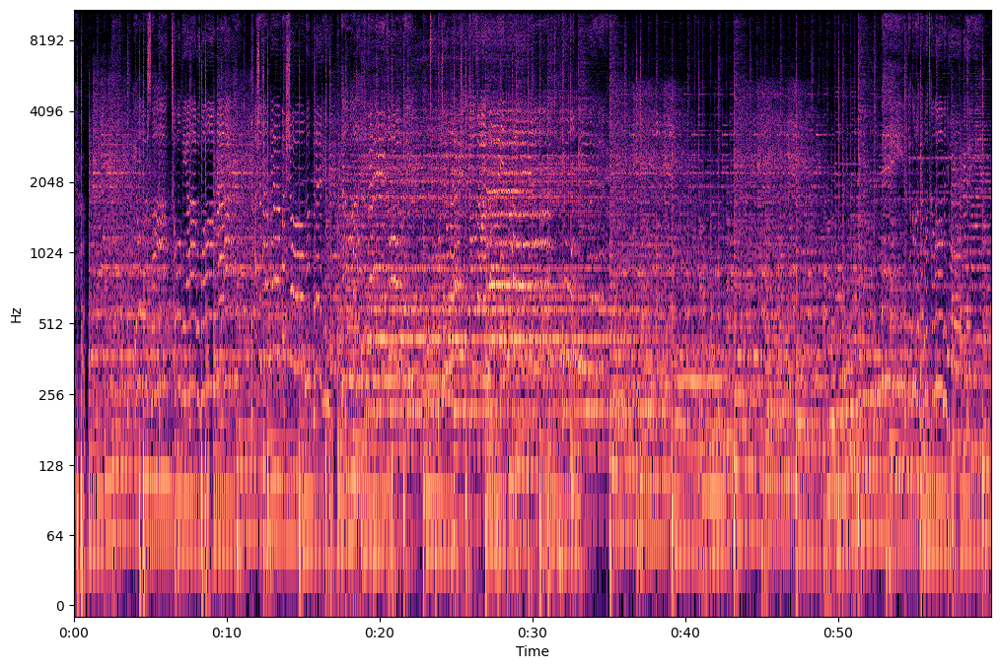

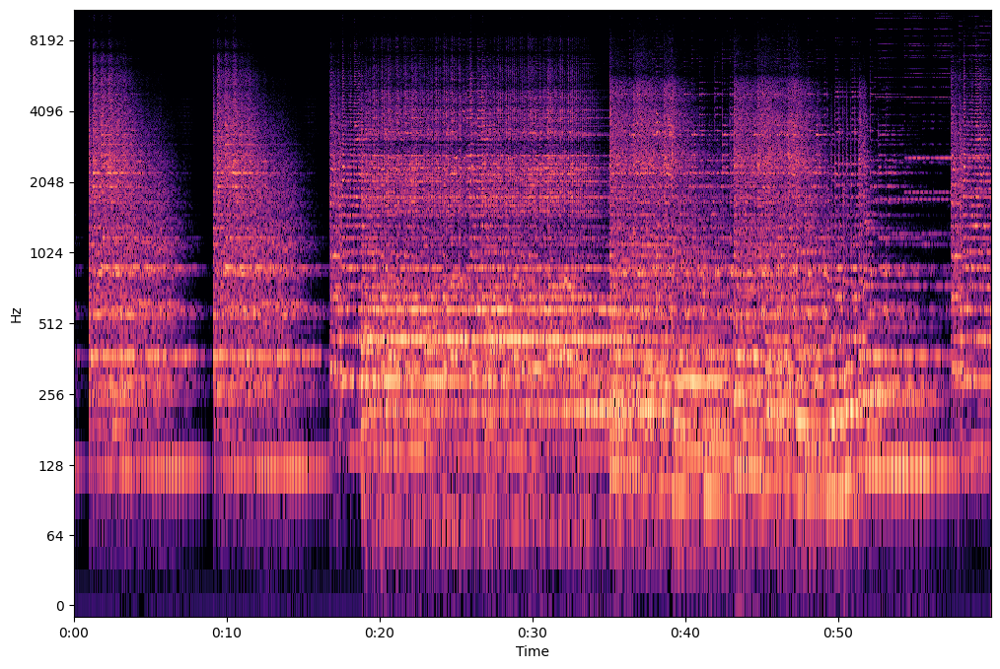

C:\Users\Orest\AppData\Local\Temp\ipykernel_3064\1197944321.py:10: UserWarning: Trying to display complex-valued input. Showing magnitude instead.
  librosa.display.specshow(mask.numpy().T.astype(np.complex64), sr=22050, hop_length=256, win_length=1024, y_axis='log', x_axis='time', cmap='magma')


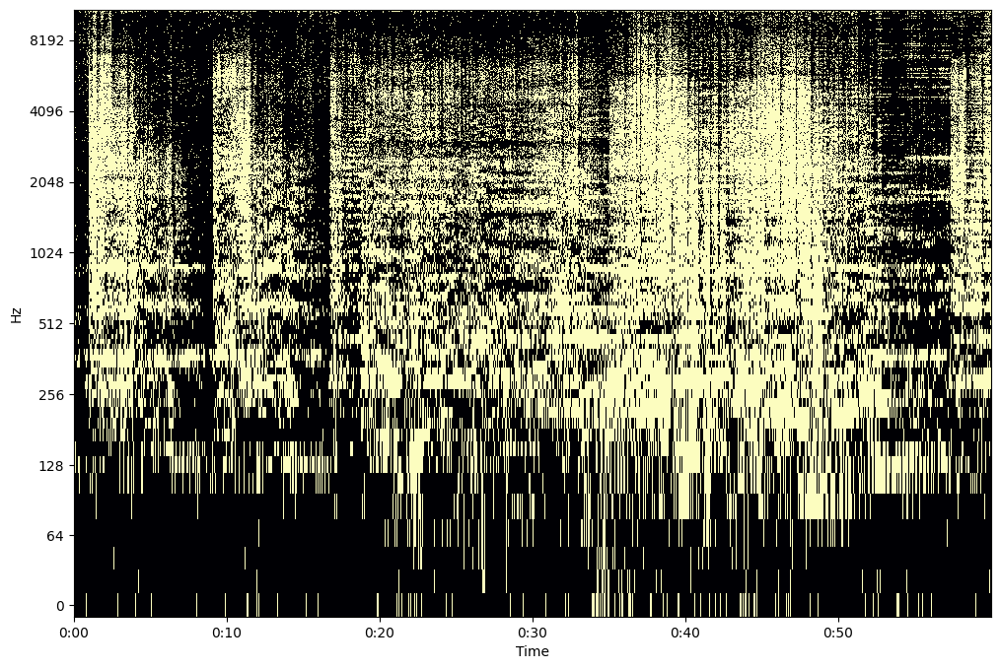

C:\Users\Orest\AppData\Local\Temp\ipykernel_3064\1197944321.py:14: UserWarning: Trying to display complex-valued input. Showing magnitude instead.
  librosa.display.specshow(result.numpy().T.astype(np.complex64), sr=22050, hop_length=256, win_length=1024, y_axis='log', x_axis='time', cmap='magma')


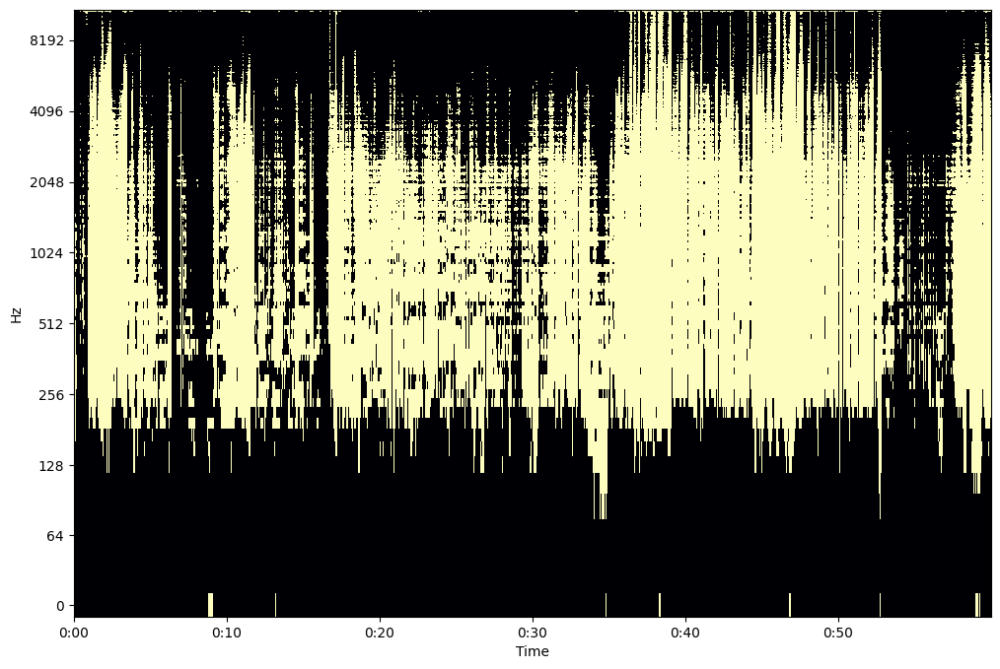

In [19]:
plt.figure(figsize=(12, 8))
librosa.display.specshow(librosa.amplitude_to_db(np.abs(mixture.numpy().T.astype(np.complex64))), sr=22050, hop_length=256, win_length=1024, y_axis='log', x_axis='time', cmap='magma')
plt.show()

plt.figure(figsize=(12, 8))
librosa.display.specshow(librosa.amplitude_to_db(np.abs(stem.numpy().T.astype(np.complex64))), sr=22050, hop_length=256, win_length=1024, y_axis='log', x_axis='time', cmap='magma')
plt.show()

plt.figure(figsize=(12, 8))
librosa.display.specshow(mask.numpy().T.astype(np.complex64), sr=22050, hop_length=256, win_length=1024, y_axis='log', x_axis='time', cmap='magma')
plt.show()

plt.figure(figsize=(12, 8))
librosa.display.specshow(result.numpy().T.astype(np.complex64), sr=22050, hop_length=256, win_length=1024, y_axis='log', x_axis='time', cmap='magma')
plt.show()

In [43]:
display(Audio(data=librosa.istft(mixture.numpy().T.astype(np.complex64), hop_length=HOP_SIZE, n_fft=WINDOW_SIZE), rate=SAMPLING_RATE)) 
display(Audio(data=librosa.istft(mixture.numpy().T.astype(np.complex64)*mask.numpy().T.astype(np.complex64), hop_length=HOP_SIZE, n_fft=WINDOW_SIZE), rate=SAMPLING_RATE)) 
display(Audio(data=librosa.istft(mixture.numpy().T.astype(np.complex64)*result.numpy().T.astype(np.complex64), hop_length=HOP_SIZE, n_fft=WINDOW_SIZE), rate=SAMPLING_RATE)) 